In [1]:
#library imports
import pandas as pd
import numpy as np
import plotly.express as px
import json
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# 1. Data Processing
## 1.1 Data Pipeline - Datafile 1
### 1.1.1. Data Processing Total Energy Usage

In [2]:
# Loading the gas usage, electricity usage via open net, and the electricity usage including solar energy of the Netherlands in total
total_energy_usage_nl = pd.read_excel('Total_energy_usage.xlsx', skiprows=1)

# Renaming columns using a dictionary
total_energy_usage_nl.rename(columns={
    "Totaal bekend energieverbruik (incl. hern. warmte, zonnestroom 'achter de meter' en auto(snel)wegen) - Nederland": 'Year',
    "Totaal bekend energieverbruik (incl. hern. warmte, zonnestroom 'achter de meter' en auto(snel)wegen)": 'Total energy usage [TJ]'
}, inplace=True)

# Setting the index
total_energy_usage_nl.set_index("Year", inplace=True)

# Dropping the NaN values of the dataframe
total_energy_usage_nl.dropna(how='any', inplace=True)

# Remove the last three rows
total_energy_usage_nl = total_energy_usage_nl.iloc[:-3]

# Display the preprocessed data
display(total_energy_usage_nl)

,Total energy usage [TJ]
Year,
2010,2036660
2011,1981297
2012,1944109
2013,1963457
2014,1839134
2015,1856334
2016,1859013
2017,1900452
2018,1930601


## 1.1.2. Data Processing Electricity and Gas prices

In [3]:
# Load electricity and gas prices data
electricity_gas_prices = pd.read_csv('Electricity_Gas_prices.csv', skiprows=4, delimiter=';')

# Rename columns using a dictionary
column_rename_dict = {
    'Perioden': 'Year',
    'Aardgasprijs |Verbruiksklassen huishoudens|20 tot 200 GJ in euro per GJ': 'Gas prices [euro/GJ]',
    'Elektriciteitsprijs |Verbruiksklassen huishoudens|2,5 tot 5 MWh euro per kWh': 'Electricity price [euro/kwh]'
}
electricity_gas_prices.rename(columns=column_rename_dict, inplace=True)

# Set the index
electricity_gas_prices.set_index("Year", inplace=True)

# Drop NaN values from the dataframe
electricity_gas_prices.dropna(how='any', inplace=True)

# Drop 'Prijscomponenten' column
electricity_gas_prices = electricity_gas_prices.drop('Prijscomponenten', axis=1)

# Replace commas with dots and convert to float
columns_to_convert = ['Gas prices [euro/GJ]', 'Electricity price [euro/kwh]']
for col in columns_to_convert:
    electricity_gas_prices[col] = electricity_gas_prices[col].str.replace(',', '.').astype(float)

# Convert euro/kwh to euro/100 kwh to clearly visualize the patterns in price change
electricity_gas_prices['Electricity price [euro/kwh]'] *= 100
electricity_gas_prices.rename(columns={"Electricity price [euro/kwh]": 'Electricity price [euro/100 kwh]'}, inplace=True)

display(electricity_gas_prices)

,Gas prices [euro/GJ],Electricity price [euro/100 kwh]
Year,,
2010,19.368,17.8
2011,20.266,18.0
2012,21.710,18.6
2013,22.655,19.0
2014,22.290,18.2
2015,21.476,19.2
2016,21.915,16.1
2017,21.778,15.6
2018,23.143,17.1


## 1.2. Data Pipeline - Datafile 2
### 1.2.1. Data Processing Total Renewable Energy Usage

In [4]:
# Load total renewable energy usage data
total_renewable_energy_usage_nl = pd.read_excel('Total_renewable_energy_usage.xlsx', skiprows=1)

# Rename columns using a dictionary
column_rename_dict = {
    'Totaal bekende hernieuwbare energie - Nederland': 'Year',
    'Totaal bekende hernieuwbare energie': 'Total renewable energy Usage [TJ]'
}
total_renewable_energy_usage_nl.rename(columns=column_rename_dict, inplace=True)

# Set the index
total_renewable_energy_usage_nl.set_index("Year", inplace=True)

# Drop NaN values from the dataframe
total_renewable_energy_usage_nl.dropna(how='any', inplace=True)

# Remove the last three rows
total_renewable_energy_usage_nl = total_renewable_energy_usage_nl.iloc[:-3]

# Display the preprocessed data
display(total_renewable_energy_usage_nl)

,Total renewable energy Usage [TJ]
Year,
2010,77960
2011,85101
2012,90016
2013,94632
2014,103133
2015,112273
2016,117078
2017,130215
2018,147663


## 1.3. Data Pipeline - Datafile 3
### 1.3.1. Data Processing Of The Total and Renewable Energy Usage Of The Different Municipalities Over Time

In [5]:
## Load datasets

# The original datasets are using a semicolon (;) instead of a comma (,) as a delimiter. 
# To load the CSV file correctly, the delimiter is specified in the 'pd.read_csv()' function.

rnew_energy = pd.read_csv('Total_renewable_energy_municipality.csv', delimiter=';')
energy = pd.read_csv('Total_energy_municipality.csv', delimiter=';')

## Format datasets

# The original datasets specify the columns using data information and year: 
# 'Totaal bekende hernieuwbare elektriciteit|2010'. In order to have a clear and readable dataset,
# these names are changed to only the year using the .split() method to split the name at the '|' character.

# Extract the year from the column names for rnew_elec
new_columns_rnew = [col.split('|')[-1] for col in rnew_energy.columns]
new_columns_energy = [col.split('|')[-1] for col in energy.columns]

# Assign the new column names to the Data Sets
rnew_energy.columns = new_columns_rnew
energy.columns = new_columns_energy

# Change the name of the 'Gemeenten' column to 'Municipality'
rnew_energy = rnew_energy.rename(columns={'Gemeenten': 'Municipality'})
energy = energy.rename(columns={'Gemeenten': 'Municipality'})

# Assign the new set to a new variable name
rnew_energy_filtered = rnew_energy 
energy_filtered = energy 

# display(rnew_energy_filtered)
# display(energy_filtered)

cbs_georef_2023 = gpd.read_file("bestuurlijkegrenzen.gpkg")

## Format data

# Filter the data so we only have the columns of the 'gem_name' and 'geometry'
cbs_georef_2023_filtered = cbs_georef_2023[['gemeentenaam', 'geometry']]

# Change the name of the 'gem_name' column to 'Municipality' in order to be consistent across datasets
cbs_georef_2023_filtered = cbs_georef_2023_filtered.rename(columns={'gemeentenaam': 'Municipality'})
cbs_georef_2023_filtered

# Since one datasets consists of 342 lines and the other of 352 we have to compare these two sets.
# This is done by creating a new dataset where the 'Municipality' value is not found in the 'Municipality' column of the 'rnew_energy' or 'energy' dataframe. 
# In other words, it finds the 'Municipality' values that are present in the GeoPackage file ('cbs_georef_2023_filtered') 
# but not in the CSV files ('rnew_energy_filtered', 'energy_filtered'). And vice versa.

# Since both datasets ('rnew_energy_filtered', 'energy_filtered') have the same municipalities, only one dataset is chosen
# to compare with the 'cbs_georef_2023_filtered' dataset
missing_in_rnew_energy = cbs_georef_2023_filtered.loc[~cbs_georef_2023_filtered['Municipality'].isin(rnew_energy_filtered['Municipality'])]
# print(missing_in_rnew_energy['Municipality'])

missing_in_cbs_georef_2023_filtered = rnew_energy_filtered.loc[~rnew_energy_filtered['Municipality'].isin(cbs_georef_2023_filtered['Municipality'])]
# print(missing_in_cbs_georef_2023_filtered['Municipality'])

# Setting 'Municipality' as index for all datasets : 'rnew_energy_filtered', 'cbs_georef_2023_filtered'
# This is done to rename and drop certain rows based on municipality names.

cbs_georef_2023_filtered.set_index('Municipality', inplace=True)
rnew_energy_filtered.set_index('Municipality', inplace=True)
energy_filtered.set_index('Municipality', inplace=True)

# After comparing the two datasets, it can be concluded that some names overlap and some are former municipalities. 
# Therefore the overlapping names are changed and the former municipalities are removed from the Geopackage file.
# Furthermore, some very new municipalities are not included in both datasets. Since these municipalities are part of other
# in the datasets they will be removed for now to be consistent. 

# Renaming overlapping names
cbs_georef_renamed = cbs_georef_2023_filtered.rename(index={'Cuijk': 'Land van Cuijk', 
                                                            'Bergen (L)' : 'Bergen (L.)', 
                                                            'Bergen (NH)' : 'Bergen (NH.)', 
                                                            "'s-Gravenhage" : 'Den Haag', 
                                                            'Westvoorne' : 'Voorne aan Zee', 
                                                            'Hengelo (O)': 'Hengelo'}
                                                            )

# Drop former and very new municipalities

# List of former municipalities that will be removed from the geopackage dataset
to_remove_cbs_georef = ['Heerhugowaard', 
             'Mill en Sint Hubert', 
             'Beemster', 
             'Weesp', 
             'Brielle', 
             'Boxmeer', 
             'Sint Anthonis', 
             'Langedijk', 
             'Landerd', 
             'Uden', 
             'Hellevoetsluis', 
             'Grave'
            ]

# List of very new municipalities that will be removed from the renewable energy source datasets
to_remove_rnew_energy = ['Maashorst', 
                       'Dijk en Waard'
                     ]

to_remove_energy = ['Maashorst', 
                       'Dijk en Waard'
                     ]


# Removing the rows
cbs_georef_final = cbs_georef_renamed.drop(to_remove_cbs_georef, axis=0)
rnew_energy_final = rnew_energy_filtered.drop(to_remove_rnew_energy, axis=0)
energy_final = energy_filtered.drop(to_remove_energy, axis=0)

# Order the sets in alphabetical order
cbs_georef_final = cbs_georef_final.sort_index()
rnew_energy_final = rnew_energy_final.sort_index()
energy_final = energy_final.sort_index()

# Show final datasets
# display(energy_final)
# display(rnew_energy_final)
# display(cbs_georef_final)

# Merge datasets
merged_georef_rnew_energy = rnew_energy_final.merge(cbs_georef_final, on='Municipality', how='left')
merged_georef_energy = energy_final.merge(cbs_georef_final, on='Municipality', how='left')

# display(merged_georef_rnew_energy)
# display(merged_georef_energy)

# Setting up the requirements for the Heatmap

# Setting up the boundaries of the Netherlands
netherlands_boundary = gpd.read_file('Netherlands Boundaries/NLD_adm0.shp')
    
# Converting the CSV files to a GeoDataFrames
merged_georef_rnew_energy_gdf = gpd.GeoDataFrame(merged_georef_rnew_energy, geometry='geometry')
merged_georef_energy_gdf = gpd.GeoDataFrame(merged_georef_energy, geometry='geometry')

# 2. Graphical Visualization
## 2.1. Graphical Visualization - Datafile 1

### 2.1.1. Graph Of The Total Energy Usage Over Time

In [6]:
# Create an interactive line plot with hover information
fig = px.line(
    total_energy_usage_nl,
    x=total_energy_usage_nl.index,
    y='Total energy usage [TJ]',
    markers=True,
    labels={'Total energy usage [TJ]': 'Usage in TJ'},
    title='Total Energy Usage Over Time',
)

# Customize the layout
fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Usage in TJ',
    legend_title='Legend',
    xaxis=dict(tickangle=45),
    showlegend=True,
    hovermode='closest',
)

# Show the plot
fig.show()

# Save the plot as a PNG image
fig.write_image("Total_Usage_Over_Time.png")

### 2.1.2. Graph Gas and Electricity Prices Over Time

In [7]:
# Plot both 'Gas prices' and 'Electricity price' on the same figure
fig = px.line(
    electricity_gas_prices,
    x=electricity_gas_prices.index,
    y=['Gas prices [euro/GJ]', 'Electricity price [euro/100 kwh]'],
    markers=True,
    labels={'value': 'Price in Euros'},
    title='Gas and Electricity Prices Over Time',
)

# Customize the layout
fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Price in Euros',
    legend_title='Legend',
    xaxis=dict(tickangle=45),
    showlegend=True,
    hovermode='closest',
)

# Show the plot
fig.show()

# Save the plot as a PNG image
fig.write_image("Gas_and_Electricity_Prices_Over_Time.png")

### 2.1.3. Graph Total Energy Usage - Gas and Electricity Prices Over Time

In [18]:
# Create subplots with two different y-axes
fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces for total energy usage
trace_total_energy = go.Scatter(
    x=total_energy_usage_nl.index,
    y=total_energy_usage_nl['Total energy usage [TJ]'],
    mode='markers+lines',
    name='Total Usage [TJ]',
    marker=dict(symbol='circle', size=8, color='red'),
    line=dict(color='red', width=2)
)

# Add trace for Gas prices
trace_gas_prices = go.Scatter(
    x=electricity_gas_prices.index,
    y=electricity_gas_prices['Gas prices [euro/GJ]'],
    mode='markers+lines',
    name='Gas prices [euro/GJ]',
    marker=dict(symbol='circle', size=8, color='blue'),
    line=dict(color='blue', width=2),
    yaxis='y2'
)

# Add trace for Electricity prices
trace_electricity_prices = go.Scatter(
    x=electricity_gas_prices.index,
    y=electricity_gas_prices['Electricity price [euro/100 kwh]'],
    mode='markers+lines',
    name='Electricity price [euro/100 kWh]',
    marker=dict(symbol='circle', size=8, color='green'),
    line=dict(color='green', width=2),
    yaxis='y2'
)

# Add traces to the subplots
fig.add_trace(trace_total_energy, secondary_y=False)
fig.add_trace(trace_gas_prices, secondary_y=True)
fig.add_trace(trace_electricity_prices, secondary_y=True)

# Customize layout
fig.update_layout(
    title='Total Energy Usage - Gas and Electricity Prices Over Time',
    xaxis=dict(title='Year', tickangle=45),
    yaxis=dict(title='Usage in TJ', showgrid=False),
    yaxis2=dict(title='Price in Euros', overlaying='y', side='right', showgrid=False),
    legend=dict(title='Legend', x=0, y=1.12, traceorder='normal', orientation='h'),
    showlegend=True,
    hovermode='x'
)

# Show the plot
fig.show()

# Save the plot as a PNG image
fig.write_image("Graph_Total_Energy_Usage-Gas_and_Electricity_Prices.png")

## 2.2. Graphical Visualization - Datafile 2
### 2.2.1. Graph Of The Renewable Energy Usage

In [9]:
# Create an interactive line plot with hover information
fig = px.line(
    total_renewable_energy_usage_nl,
    x=total_renewable_energy_usage_nl.index,
    y='Total renewable energy Usage [TJ]',
    markers=True,
    labels={'Total renewable energy Usage [TJ]': 'Renewable Energy in TJ'},
    title='Renewable Energy Usage Over Time',
)

# Customize the layout
fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Renewable Energy in TJ',
    legend_title='Legend',
    xaxis=dict(tickangle=45),
    showlegend=True,
    hovermode='closest',
)

# Show the plot
fig.show()

# Save the plot as a PNG image
fig.write_image("Renewable_Energy_Usage.png")

## 2.2.2. Bar Chart Of The Total And Renewable Energy Usage Over Time

<Figure size 1000x400 with 0 Axes>

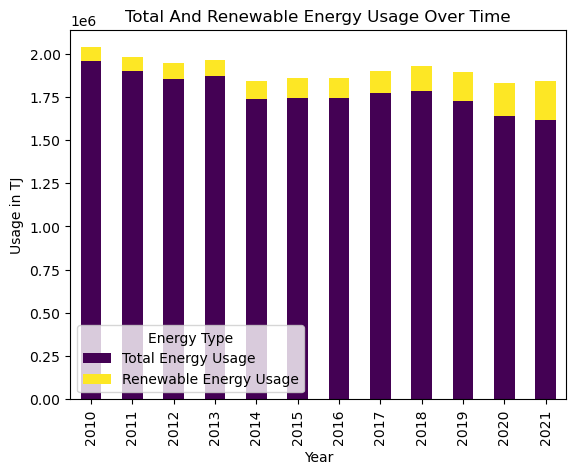

<Figure size 640x480 with 0 Axes>

In [10]:
overall_energy = total_energy_usage_nl['Total energy usage [TJ]'] - total_renewable_energy_usage_nl['Total renewable energy Usage [TJ]']

# Combine the data into a single DataFrame
combined_df = pd.concat([overall_energy, total_renewable_energy_usage_nl], axis=1)
combined_df.columns = ['Total Energy Usage', 'Renewable Energy Usage']

# Plot a stacked bar chart
plt.figure(figsize=(10, 4))
combined_df.plot(kind='bar', stacked=True, colormap='viridis')

plt.title('Total And Renewable Energy Usage Over Time')
plt.xlabel('Year')
plt.ylabel('Usage in TJ')
plt.legend(title='Energy Type')

# Display the plot
plt.show()

# Save the plot as a PNG image
plt.savefig("Bar_Chart_Of_The_Total_And_Renewable_Energy_Usage.png")

## 2.2.3. Graph Of The Percentage Renewable Energy over Time

In [11]:
# Calculating percentage Renewable energy of Total energy usage
perc_renewables = (total_renewable_energy_usage_nl['Total renewable energy Usage [TJ]'] / total_energy_usage_nl['Total energy usage [TJ]']) * 100

# Plot percentage Renewable energy over time
fig = px.line(
    perc_renewables,
    x=total_renewable_energy_usage_nl.index,
    y= perc_renewables,
    markers=True,
    labels={'value': 'Percentage Renewable Energy'},
    title='Percentage Renewable Energy over Time',
)

# Customize the layout
fig.update_layout(
    xaxis_title='Year',
    yaxis_title='Percentage Renewables %',
    legend_title='Legend',
    xaxis=dict(tickangle=45),
    showlegend=True,
    hovermode='closest',
)

# Show the plot
fig.show()

# Save the plot as a PNG image
fig.write_image("Percentage_Renewable_Energy.png")

## 2.3. Graphical Visualization - Datafile 3
### 2.3.1. Graph Of The Renewable Energy Usage Of The Different Municipalities Over Time

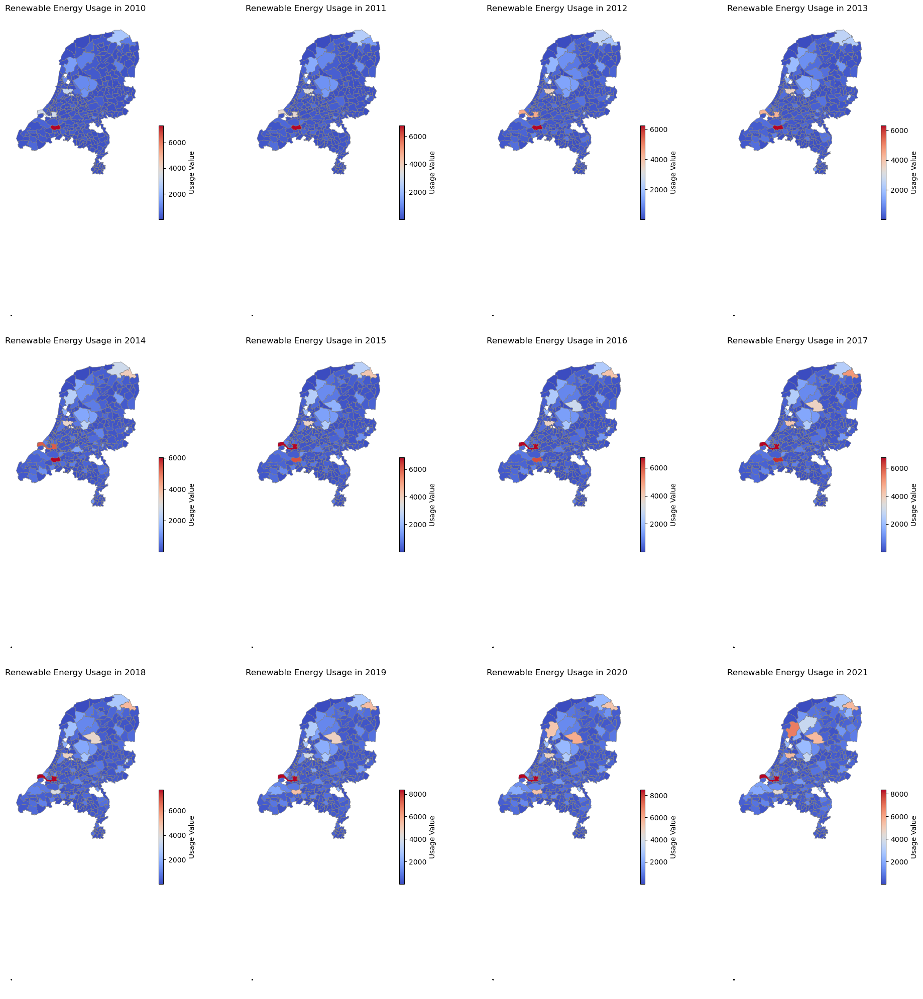

<Figure size 640x480 with 0 Axes>

In [12]:
# Years to loop through
years = [str(year) for year in range(2010, 2022)]

# Set up a grid of subplots
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 20))

# Flatten axes for easier indexing
axes = axes.flatten()

for idx, year in enumerate(years):
    ax = axes[idx]

    # Plot the boundaries of Netherlands for context
    netherlands_boundary.boundary.plot(ax=ax, linewidth=1.5, color="black")

    # Plot the municipality choropleth map using the renewable energy data in the respective year's column for coloring
    merged_georef_rnew_energy_gdf.plot(column=year, 
                                     cmap='coolwarm', 
                                     linewidth=0.5, 
                                     ax=ax, 
                                     edgecolor='0.5', 
                                     legend=True, 
                                     legend_kwds={'shrink': 0.3, 
                                                  'label': "Usage Value",
                                                 }
                                     )

    # Adjusting title and other visual aspects
    ax.set_title(f"Renewable Energy Usage in {year}", fontdict={'fontsize': '12', 'fontweight' : '3'})
    ax.axis('off')

# Adjust the layout of the plots
plt.tight_layout()
plt.show()

# Save the plot as an image file
plt.savefig('renewable_energy_usage_plot_municipality.png')

## 2.3.2. Animation Of The Renewable Energy Usage Of The Different Municipalities Over Time

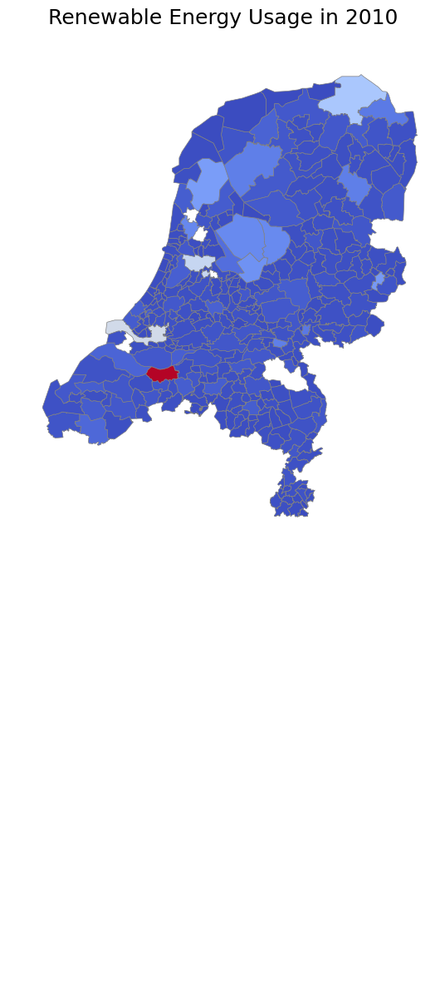

In [26]:
# Years to loop through
years = [str(year) for year in range(2010, 2022)]

# Initialize the figure
fig, ax = plt.subplots(figsize=(15, 15))

# Plot the static boundary once, so it doesn't get cleared
netherlands_boundary.boundary.plot(ax=ax, linewidth=1.5, color="black")
ax.axis('off')

# Function to update the figure
def update(year):
    # Clear only the data layers (keep the boundary)
    for artist in ax.lines + ax.collections:
        artist.remove()
    # Plot the municipality choropleth map using the renewable energy data in the respective year's column for coloring
    merged_georef_rnew_energy_gdf.plot(column=year, 
                                     cmap='coolwarm', 
                                     linewidth=0.5, 
                                     ax=ax, 
                                     edgecolor='0.5', 
                                     legend=False,  # This will create the legend anew each frame
                                     legend_kwds={'shrink': 0.5, 'label': "Usage Value"})
    
    # Since the title and other static elements are kept, we only update the title text
    ax.set_title(f"Renewable Energy Usage in {year}", fontdict={'fontsize': '18', 'fontweight' : '3'})

# Create the animation
anim = FuncAnimation(fig, update, frames=years, repeat=True)

# Save the animation
anim.save('rnew_energy_usage_animation.gif', writer='pillow', fps=0.5)

# To display the animation in a Jupyter notebook
from IPython.display import HTML
HTML(anim.to_jshtml())



### 2.3.3. Animation Of The Energy Usage Of The Different Municipalities Over Time

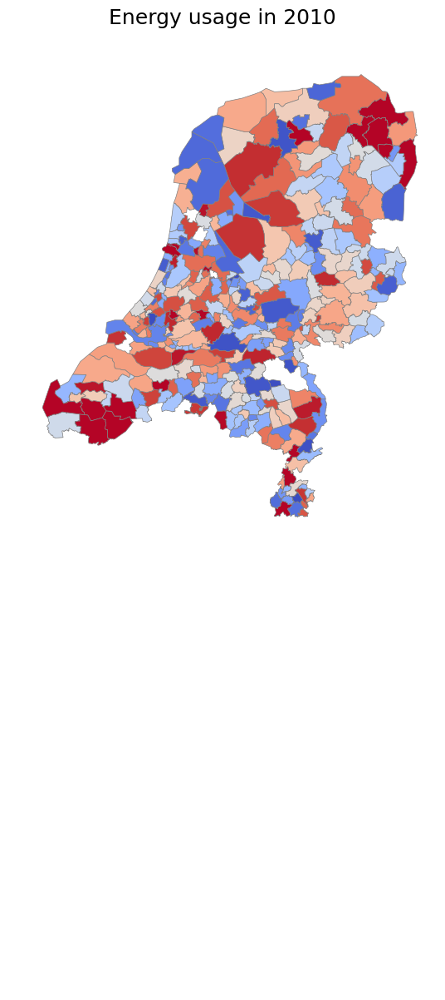

In [25]:
# Years to loop through
years = [str(year) for year in range(2010, 2022)]

# Initialize the figure
fig, ax = plt.subplots(figsize=(15, 15))

# Plot the static boundary once, so it doesn't get cleared
netherlands_boundary.boundary.plot(ax=ax, linewidth=1.5, color="black")
ax.axis('off')

# Function to update the figure
def update(year):
    # Clear only the data layers (keep the boundary)
    for artist in ax.lines + ax.collections:
        artist.remove()
    # Plot the municipality choropleth map using the energy usage data in the respective year's column for coloring
    merged_georef_energy_gdf.plot(column=year, 
                                     cmap='coolwarm', 
                                     linewidth=0.5, 
                                     ax=ax, 
                                     edgecolor='0.5', 
                                     legend=False,  # This will create the legend anew each frame
                                 )
    
    # Since the title and other static elements are kept, we only update the title text
    ax.set_title(f"Energy usage in {year}", fontdict={'fontsize': '18', 'fontweight' : '3'})

# Create the animation
anim = FuncAnimation(fig, update, frames=years, repeat=True)

# Save the animation
anim.save('energy_usage_animation.gif', writer='pillow', fps=0.5)

# To display the animation in a Jupyter notebook
from IPython.display import HTML
HTML(anim.to_jshtml())